In [49]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt 
import seaborn as sns
%matplotlib inline
sns.set()
import warnings
warnings.filterwarnings("ignore")
import plotly.express as px
import plotly.graph_objects as go

In [50]:
df = pd.read_csv(r"D:\Data\val_stats.csv")

# Steps:
- [ ] Explore Data
- [ ] Columns Selection
- [ ] Encoding process
- [ ] Scaling

In [3]:
df.head()

,region,name,tag,rating,damage_round,headshots,headshot_percent,aces,clutches,flawless,...,gun2_name,gun2_head,gun2_body,gun2_legs,gun2_kills,gun3_name,gun3_head,gun3_body,gun3_legs,gun3_kills
0,NaN,ShimmyXD,#NA1,Radiant,135.8,992,24.9,0,140,80,...,Phantom,33,62,5,220,Classic,36,60,3,147
1,NaN,XSET Cryo,#cells,Radiant,170.3,879,28.3,2,122,94,...,Operator,8,91,0,226,Phantom,32,63,5,137
2,NaN,PuRelittleone,#yoruW,Radiant,147.5,720,24.0,3,117,59,...,Phantom,36,61,3,231,Operator,8,91,1,102
3,NaN,Boba,#0068,Radiant,178.2,856,37.3,3,83,49,...,Sheriff,48,51,1,48,Phantom,44,56,0,36
4,NaN,i love mina,#kelly,Radiant,149.8,534,24.4,2,71,38,...,Spectre,21,71,8,65,Operator,8,92,0,64


In [4]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 85678 entries, 0 to 85677
Data columns (total 38 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   region            64813 non-null  object 
 1   name              85674 non-null  object 
 2   tag               85358 non-null  object 
 3   rating            85678 non-null  object 
 4   damage_round      85678 non-null  float64
 5   headshots         85678 non-null  object 
 6   headshot_percent  85678 non-null  float64
 7   aces              85678 non-null  int64  
 8   clutches          85678 non-null  int64  
 9   flawless          85678 non-null  int64  
 10  first_bloods      85678 non-null  object 
 11  kills             85678 non-null  object 
 12  deaths            85678 non-null  object 
 13  assists           85678 non-null  object 
 14  kd_ratio          85678 non-null  float64
 15  kills_round       85678 non-null  float64
 16  most_kills        85678 non-null  int64 

In [5]:
df.describe().round()

,damage_round,headshot_percent,aces,clutches,flawless,kd_ratio,kills_round,most_kills,score_round,wins,...,gun1_head,gun1_body,gun1_legs,gun2_head,gun2_body,gun2_legs,gun3_head,gun3_body,gun3_legs,gun3_kills
count,85678.0,85678.0,85678.0,85678.0,85678.0,85678.0,85678.0,85678.0,85678.0,85678.0,...,85678.0,85678.0,85678.0,85678.0,85678.0,85678.0,85678.0,85678.0,85678.0,85678.0
mean,143.0,24.0,1.0,66.0,39.0,1.0,1.0,28.0,218.0,24.0,...,34.0,61.0,4.0,30.0,65.0,5.0,31.0,65.0,4.0,59.0
std,16.0,5.0,1.0,53.0,31.0,0.0,0.0,5.0,26.0,18.0,...,8.0,7.0,2.0,13.0,12.0,3.0,16.0,15.0,4.0,51.0
min,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
25%,133.0,20.0,0.0,27.0,16.0,1.0,1.0,25.0,202.0,10.0,...,29.0,57.0,3.0,24.0,59.0,2.0,20.0,57.0,1.0,23.0
50%,142.0,23.0,1.0,54.0,32.0,1.0,1.0,28.0,217.0,20.0,...,34.0,62.0,4.0,30.0,65.0,4.0,28.0,67.0,4.0,46.0
75%,152.0,27.0,2.0,92.0,55.0,1.0,1.0,31.0,233.0,33.0,...,39.0,66.0,5.0,37.0,71.0,6.0,40.0,73.0,6.0,81.0
max,341.0,83.0,24.0,488.0,316.0,6.0,2.0,58.0,550.0,170.0,...,100.0,100.0,50.0,100.0,100.0,100.0,100.0,100.0,100.0,650.0


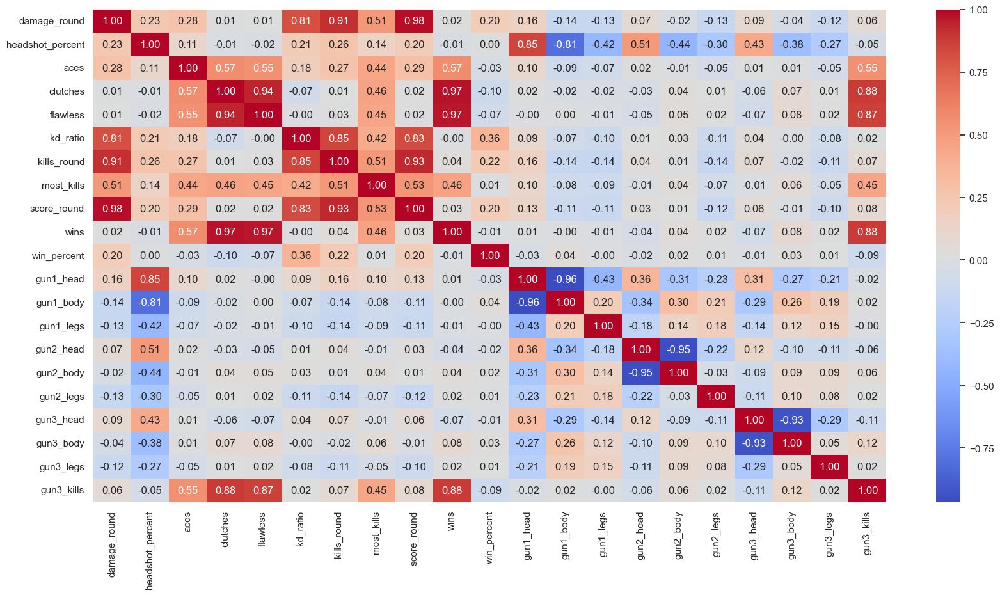

In [6]:
plt.figure(figsize=(20,10))
sns.heatmap(df.corr(numeric_only=True),annot = True,fmt='.2f',cmap="coolwarm")
plt.show()

# Steps:
- [x] Explore Data
- [ ] Columns Selection
- [ ] Encoding process
- [ ] Scaling

In [7]:
df[['kills','deaths','assists']]

,kills,deaths,assists
0,"1,506","1,408",703
1,"1,608","1,187",206
2,"1,115","1,064",267
3,"1,134",812,157
4,869,781,213
...,...,...,...
85673,603,508,296
85674,885,606,271
85675,919,733,136
85676,204,174,101


In [8]:
df['kills'] = df['kills'].str.replace(',','')

In [9]:
df['deaths'] = df['deaths'].str.replace(',','')

In [10]:
df['assists'] = df['assists'].str.replace(',','')

In [11]:
df[['kills','deaths','assists']]

,kills,deaths,assists
0,1506,1408,703
1,1608,1187,206
2,1115,1064,267
3,1134,812,157
4,869,781,213
...,...,...,...
85673,603,508,296
85674,885,606,271
85675,919,733,136
85676,204,174,101


In [12]:
df[['kills','deaths','assists']] = df[['kills','deaths','assists']].astype(float)

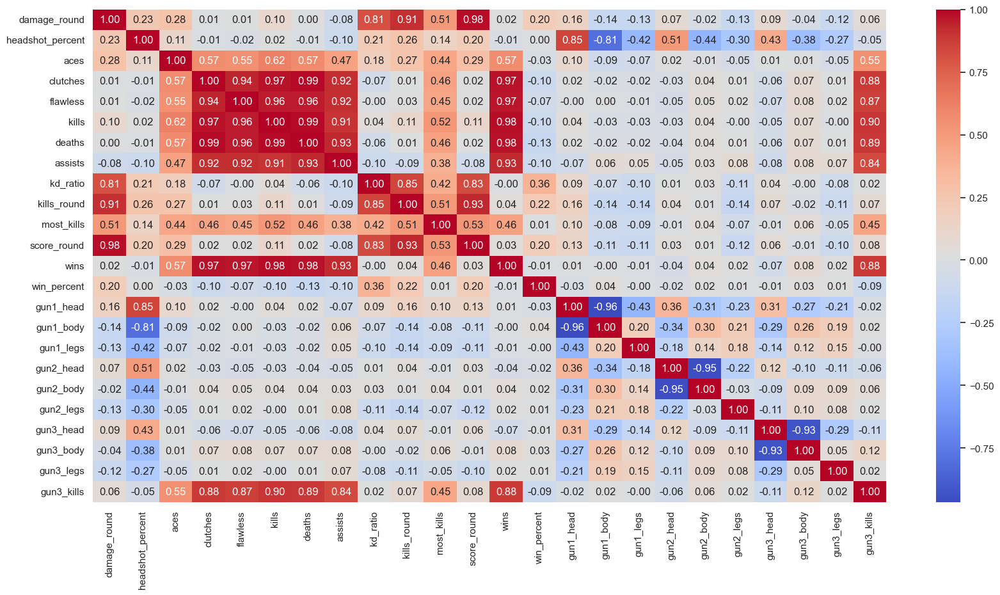

In [13]:
plt.figure(figsize=(20,10))
sns.heatmap(df.corr(numeric_only=True),annot = True,fmt='.2f',cmap="coolwarm")
plt.show()

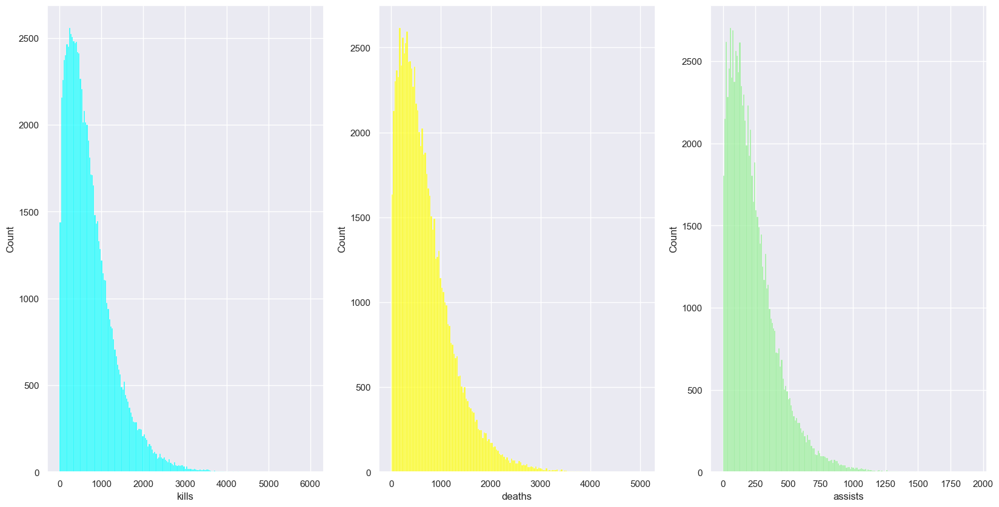

In [14]:
plt.figure(figsize=(20,10))
plt.subplot(1,3,1)
sns.histplot(data=df,x='kills',color='cyan')

plt.subplot(1,3,2)
sns.histplot(data=df,x='deaths',color='yellow')

plt.subplot(1,3,3)
sns.histplot(data=df,x='assists',color='lightgreen')
plt.show()

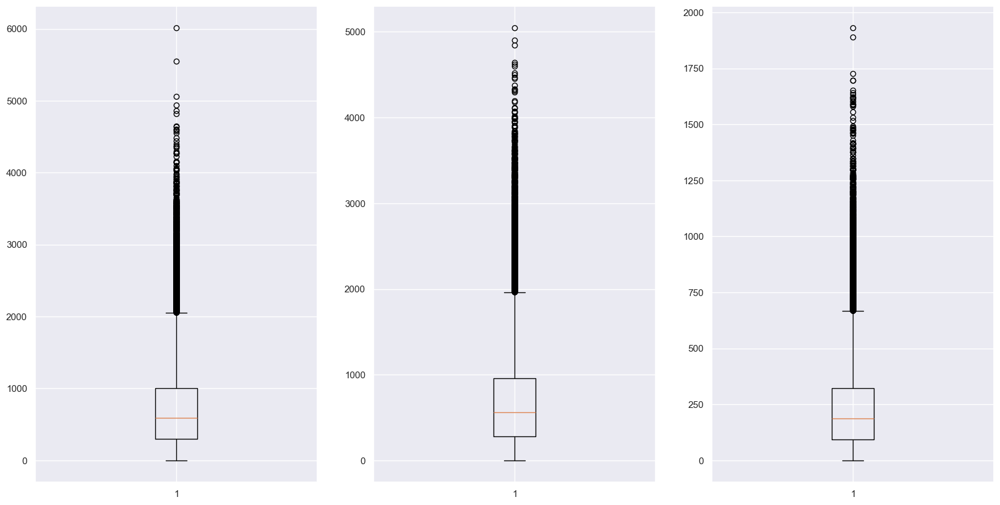

In [15]:
plt.figure(figsize=(20,10))
plt.subplot(1,3,1)
plt.boxplot(data=df,x='kills')

plt.subplot(1,3,2)
plt.boxplot(data=df,x='deaths')

plt.subplot(1,3,3)
plt.boxplot(data=df,x='assists')
plt.show()

# Steps:
- [x] Explore Data
- [x] Columns Selection
- [ ] Encoding process
- [ ] Scaling

Columns will be discard
**

0   region            64813 non-null  object

1   name              85674 non-null  object

2   tag               85358 non-null  object

5   headshots         85678 non-null  object

11  kills             85678 non-null  object 

12  deaths            85678 non-null  object

13  assists           85678 non-null  object 

18  wins              85678 non-null  float64

23  gun1_name         85678 non-null  object

24  gun1_head         85678 non-null  int64

25  gun1_body         85678 non-null  int64

26  gun1_legs         85678 non-null  int64

27  gun1_kills        85678 non-null  object

28  gun2_name         85678 non-null  object

29  gun2_head         85678 non-null  int64

30  gun2_body         85678 non-null  int64

31  gun2_legs         85678 non-null  int64

32  gun2_kills        85678 non-null  object

33  gun3_name         85678 non-null  object

34  gun3_head         85678 non-null  int64

35  gun3_body         85678 non-null  int64

36  gun3_legs         85678 non-null  int64

37  gun3_kills        85678 non-null  int64  
**

In [51]:
df.columns

Index(['region', 'name', 'tag', 'rating', 'damage_round', 'headshots',
       'headshot_percent', 'aces', 'clutches', 'flawless', 'first_bloods',
       'kills', 'deaths', 'assists', 'kd_ratio', 'kills_round', 'most_kills',
       'score_round', 'wins', 'win_percent', 'agent_1', 'agent_2', 'agent_3',
       'gun1_name', 'gun1_head', 'gun1_body', 'gun1_legs', 'gun1_kills',
       'gun2_name', 'gun2_head', 'gun2_body', 'gun2_legs', 'gun2_kills',
       'gun3_name', 'gun3_head', 'gun3_body', 'gun3_legs', 'gun3_kills'],
      dtype='object')

In [52]:
columns = ['rating', 'damage_round','headshot_percent', 'aces', 'clutches', 'flawless', 'first_bloods',
          'win_percent', 'kd_ratio', 'kills_round', 'most_kills',
           'score_round','agent_1']

In [53]:
featuers = df[columns]

In [54]:
featuers.head()

,rating,damage_round,headshot_percent,aces,clutches,flawless,first_bloods,win_percent,kd_ratio,kills_round,most_kills,score_round,agent_1
0,Radiant,135.8,24.9,0,140,80,161,59.6,1.07,0.7,29,208.8,Fade
1,Radiant,170.3,28.3,2,122,94,316,65.8,1.35,1.0,32,270.6,Chamber
2,Radiant,147.5,24.0,3,117,59,216,65.6,1.05,0.8,39,227.8,Yoru
3,Radiant,178.2,37.3,3,83,49,235,62.8,1.40,1.0,37,277.0,Jett
4,Radiant,149.8,24.4,2,71,38,137,62.8,1.11,0.8,29,230.9,Jett


In [55]:
featuers.isna().sum()

rating              0
damage_round        0
headshot_percent    0
aces                0
clutches            0
flawless            0
first_bloods        0
win_percent         0
kd_ratio            0
kills_round         0
most_kills          0
score_round         0
agent_1             0
dtype: int64

In [56]:
featuers.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 85678 entries, 0 to 85677
Data columns (total 13 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   rating            85678 non-null  object 
 1   damage_round      85678 non-null  float64
 2   headshot_percent  85678 non-null  float64
 3   aces              85678 non-null  int64  
 4   clutches          85678 non-null  int64  
 5   flawless          85678 non-null  int64  
 6   first_bloods      85678 non-null  object 
 7   win_percent       85678 non-null  float64
 8   kd_ratio          85678 non-null  float64
 9   kills_round       85678 non-null  float64
 10  most_kills        85678 non-null  int64  
 11  score_round       85678 non-null  float64
 12  agent_1           85678 non-null  object 
dtypes: float64(6), int64(4), object(3)
memory usage: 8.5+ MB


In [57]:
featuers['first_bloods'] = featuers['first_bloods'].astype(str).str.replace(',', '', regex=False)

In [58]:
featuers['first_bloods'] = featuers['first_bloods'].astype(float)

In [59]:
df_vis = featuers.copy()

## Label encoding here will not be the best 

In [60]:
featuers['rating'].sort_values().unique()

array(['Bronze 2', 'Bronze 3', 'Diamond 1', 'Diamond 2', 'Diamond 3',
       'Gold 1', 'Gold 2', 'Gold 3', 'Immortal 1', 'Immortal 2',
       'Immortal 3', 'Platinum 1', 'Platinum 2', 'Platinum 3', 'Radiant',
       'Silver 1', 'Silver 2', 'Silver 3', 'Unrated'], dtype=object)

In [61]:
rank_order = [
    'Unrated',
    'Bronze 2', 'Bronze 3',
    'Silver 1', 'Silver 2', 'Silver 3',
    'Gold 1', 'Gold 2', 'Gold 3',
    'Platinum 1', 'Platinum 2', 'Platinum 3',
    'Diamond 1', 'Diamond 2', 'Diamond 3',
    'Immortal 1', 'Immortal 2', 'Immortal 3',
    'Radiant'
]

rank_mapping = {rank: idx for idx, rank in enumerate(rank_order)}
rank_mapping

{'Unrated': 0,
 'Bronze 2': 1,
 'Bronze 3': 2,
 'Silver 1': 3,
 'Silver 2': 4,
 'Silver 3': 5,
 'Gold 1': 6,
 'Gold 2': 7,
 'Gold 3': 8,
 'Platinum 1': 9,
 'Platinum 2': 10,
 'Platinum 3': 11,
 'Diamond 1': 12,
 'Diamond 2': 13,
 'Diamond 3': 14,
 'Immortal 1': 15,
 'Immortal 2': 16,
 'Immortal 3': 17,
 'Radiant': 18}

In [62]:
featuers['rating'] = featuers['rating'].map(rank_mapping)

In [63]:
featuers.sample(5)

,rating,damage_round,headshot_percent,aces,clutches,flawless,first_bloods,win_percent,kd_ratio,kills_round,most_kills,score_round,agent_1
83145,15,133.4,29.0,0,49,42,74.0,37.2,1.02,0.7,26,202.6,Fade
20223,17,130.8,19.3,1,107,70,109.0,54.9,0.95,0.7,26,196.8,Sova
7665,15,122.2,18.0,0,53,25,47.0,48.6,0.98,0.7,32,190.3,Reyna
3212,15,122.4,20.7,0,14,6,12.0,33.3,0.86,0.6,20,183.5,Brimstone
65736,15,152.9,24.0,3,97,41,183.0,57.9,1.14,0.8,28,235.5,Jett


In [29]:
featuers = pd.get_dummies(data=featuers,columns=['agent_1'],drop_first=True)

In [30]:
featuers.sample(6)

,rating,damage_round,headshot_percent,aces,clutches,flawless,first_bloods,win_percent,kd_ratio,kills_round,...,agent_1_Neon,agent_1_Omen,agent_1_Phoenix,agent_1_Raze,agent_1_Reyna,agent_1_Sage,agent_1_Skye,agent_1_Sova,agent_1_Viper,agent_1_Yoru
77284,15,138.5,20.5,2,92,35,139.0,47.1,0.93,0.7,...,False,False,False,False,False,False,False,False,False,False
55437,16,139.4,19.0,0,54,24,62.0,71.0,1.07,0.8,...,False,False,False,False,False,False,False,False,False,False
27330,15,134.0,15.8,1,89,60,110.0,52.9,1.03,0.7,...,False,False,False,False,False,False,False,False,False,False
41694,15,154.8,19.8,1,42,16,98.0,50.0,1.11,0.8,...,False,False,False,False,False,False,False,False,False,False
79605,15,126.9,26.1,0,72,29,91.0,46.7,0.97,0.7,...,False,False,False,False,False,False,False,False,False,False
40787,17,143.4,24.6,5,165,81,295.0,50.0,1.09,0.8,...,False,False,False,False,False,False,False,False,False,False


In [86]:
featuers.columns

Index(['rating', 'damage_round', 'headshot_percent', 'aces', 'clutches',
       'flawless', 'first_bloods', 'win_percent', 'kd_ratio', 'kills_round',
       'most_kills', 'score_round', 'agent_1_Breach', 'agent_1_Brimstone',
       'agent_1_Chamber', 'agent_1_Cypher', 'agent_1_Fade', 'agent_1_Jett',
       'agent_1_KAY/O', 'agent_1_Killjoy', 'agent_1_Neon', 'agent_1_Omen',
       'agent_1_Phoenix', 'agent_1_Raze', 'agent_1_Reyna', 'agent_1_Sage',
       'agent_1_Skye', 'agent_1_Sova', 'agent_1_Viper', 'agent_1_Yoru'],
      dtype='object')

# Steps:
- [x] Explore Data
- [x] Columns Selection
- [x] Encoding process
- [ ] Scaling

## First i need to see some BoxPlots to choose the best scaling method

In [31]:
num_featuer = featuers.select_dtypes(include='number')

In [32]:
num_featuer.columns

Index(['rating', 'damage_round', 'headshot_percent', 'aces', 'clutches',
       'flawless', 'first_bloods', 'win_percent', 'kd_ratio', 'kills_round',
       'most_kills', 'score_round'],
      dtype='object')

In [33]:
first_group = ['rating', 'damage_round', 'headshot_percent', 'aces', 'clutches',
       'flawless']
second_group = ['first_bloods', 'win_percent', 'kd_ratio', 'kills_round',
       'most_kills', 'score_round']

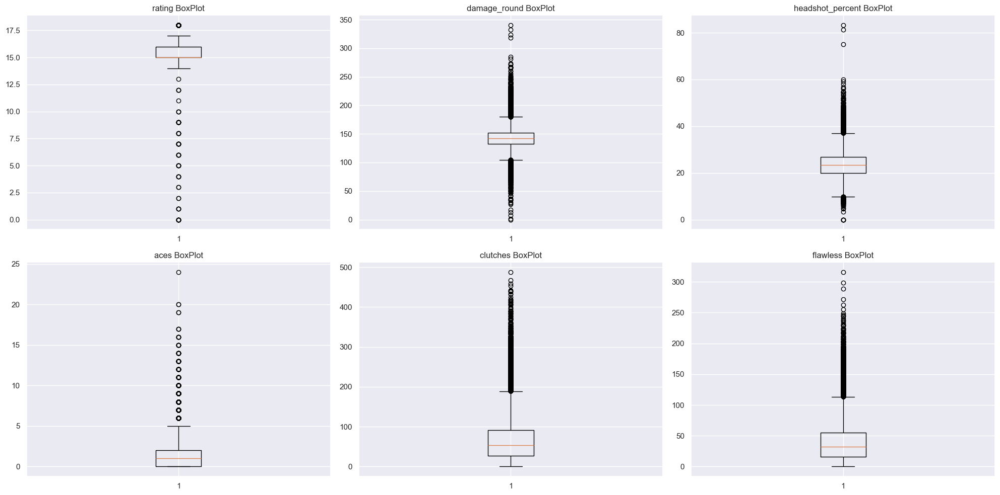

In [34]:
plt.figure(figsize=(20,10))
for i , col in enumerate(first_group):
    plt.subplot(2,3,1+i)
    plt.boxplot(x=num_featuer[col])
    plt.title(f'{col} BoxPlot')

plt.tight_layout()
plt.show()

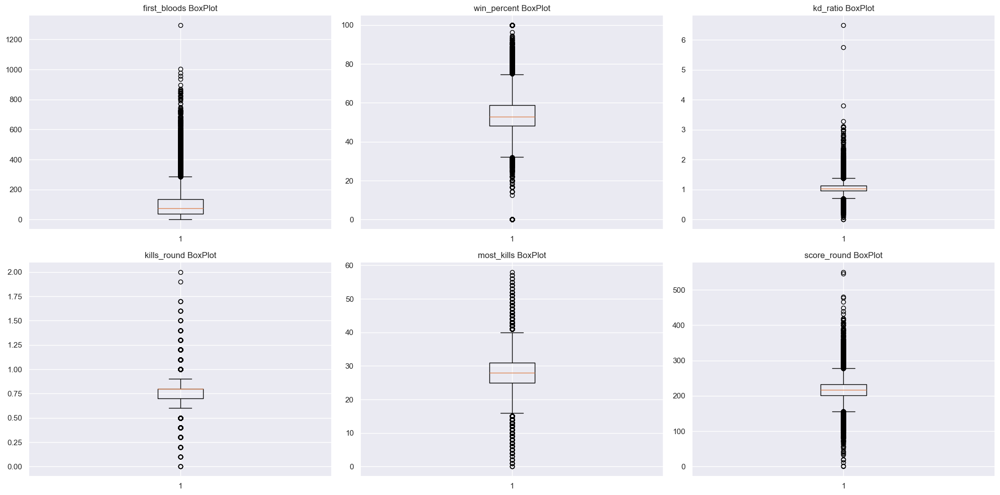

In [35]:
plt.figure(figsize=(20,10))
for i , col in enumerate(second_group):
    plt.subplot(2,3,1+i)
    plt.boxplot(x=num_featuer[col])
    plt.title(f'{col} BoxPlot')

plt.tight_layout()
plt.show()

In [36]:
copyFeatures = featuers.copy()

In [37]:
num_featuer.columns

Index(['rating', 'damage_round', 'headshot_percent', 'aces', 'clutches',
       'flawless', 'first_bloods', 'win_percent', 'kd_ratio', 'kills_round',
       'most_kills', 'score_round'],
      dtype='object')

In [41]:
columns_to_transform = ['damage_round','headshot_percent','clutches',
       'flawless','first_bloods', 'win_percent', 'kd_ratio','most_kills', 'score_round']

In [42]:
from sklearn.model_selection import train_test_split
X_train,X_test = train_test_split(featuers,test_size=.2,random_state=42)

In [45]:
X_train[columns_to_transform]

,damage_round,headshot_percent,clutches,flawless,first_bloods,win_percent,kd_ratio,most_kills,score_round
61614,139.9,17.7,193,89,219.0,53.9,0.96,31,213.4
15179,147.8,25.8,54,28,101.0,44.9,1.10,32,228.0
58152,152.7,23.3,133,59,221.0,53.0,1.13,39,235.2
50839,118.3,21.6,18,13,16.0,50.0,0.91,18,178.2
34790,134.7,22.8,36,16,42.0,58.3,1.03,26,207.3
...,...,...,...,...,...,...,...,...,...
6265,139.8,22.0,60,39,65.0,50.0,1.06,27,201.6
54886,144.2,15.5,44,47,35.0,46.5,1.17,26,221.4
76820,140.4,17.4,47,46,78.0,55.0,1.01,29,207.9
860,127.0,18.7,64,39,52.0,53.3,0.92,25,190.1


In [46]:
from sklearn.preprocessing import PowerTransformer
pt = PowerTransformer(method='yeo-johnson') 
X_train[columns_to_transform] = pt.fit_transform(X_train[columns_to_transform]) 
X_test[columns_to_transform] = pt.transform(X_test[columns_to_transform])

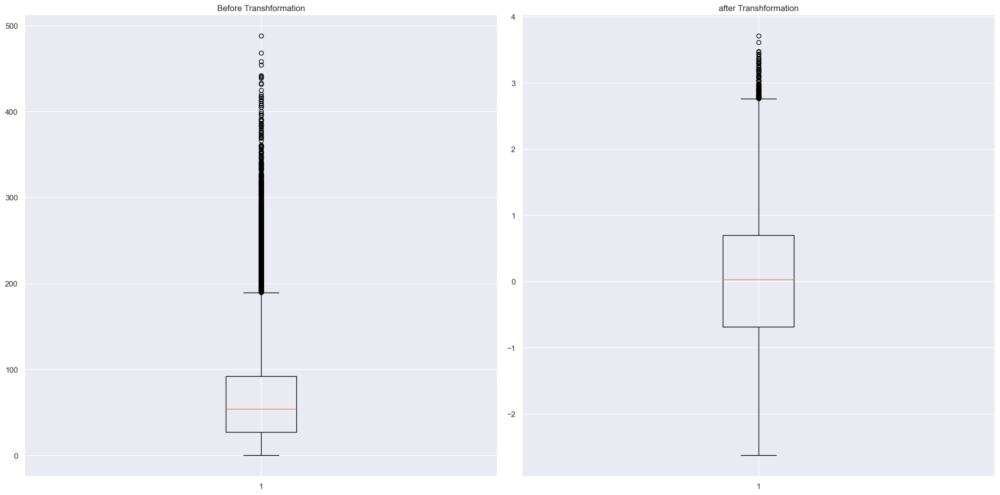

In [48]:
plt.figure(figsize=(20,10))
plt.subplot(1,2,1)
plt.boxplot(x=num_featuer['clutches'])
plt.title('Before Transhformation')

plt.subplot(1,2,2)
plt.boxplot(x=X_train['clutches'])
plt.title('after Transhformation')

plt.tight_layout()
plt.show()

### Robust Scaler Formula

The Robust Scaler scales a feature **x** using the median and interquartile range (IQR):

$$
x_{\text{scaled}} = \frac{x - \text{Median}(x)}{\text{IQR}(x)}
$$


In [49]:
from sklearn.preprocessing import RobustScaler

In [51]:
robust = RobustScaler()
X_train = robust.fit_transform(X_train)
X_test = robust.transform(X_test)

In [52]:
X_train

array([[ 3.        , -0.11079798, -0.87935257, ...,  0.        ,
         0.        ,  0.        ],
       [ 1.        ,  0.30361289,  0.35811883, ...,  0.        ,
         0.        ,  0.        ],
       [ 1.        ,  0.55746743,  0.        , ...,  0.        ,
         0.        ,  0.        ],
       ...,
       [ 0.        , -0.08437466, -0.93011131, ...,  0.        ,
         0.        ,  0.        ],
       [ 1.        , -0.80222312, -0.71315188, ...,  1.        ,
         0.        ,  0.        ],
       [ 1.        , -0.62890723, -0.69677601, ...,  0.        ,
         0.        ,  0.        ]])

In [53]:
np.save('XTrain_Scaled_Features.npy',X_train)

In [48]:
# X_train = np.load('XTrain_Scaled_Features.npy')

In [54]:
from sklearn.decomposition import PCA

## Need to Visualize the data 

In [55]:
pca_2d = PCA(n_components=2)

In [56]:
df_2d = pca_2d.fit_transform(X_train)

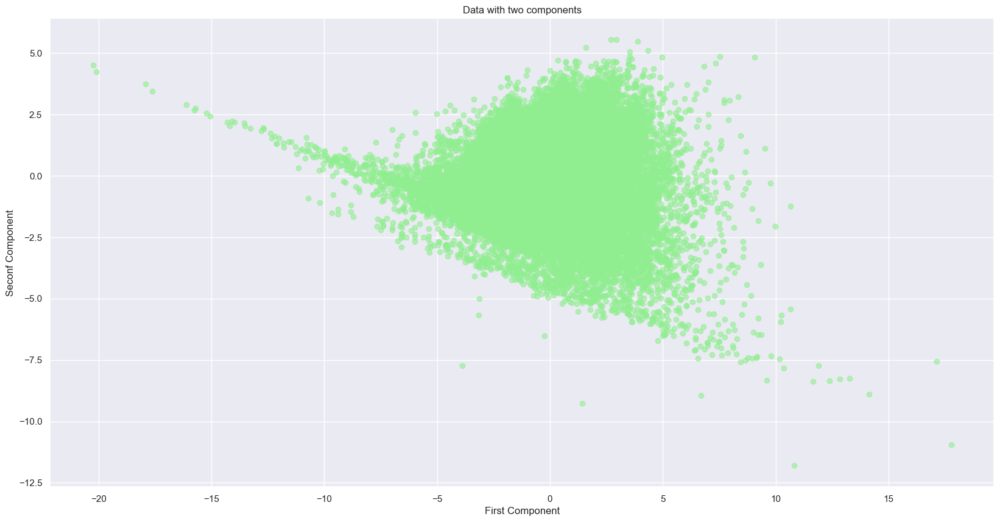

In [57]:
plt.figure(figsize=(20,10))
plt.scatter(x=df_2d[:,0],y=df_2d[:,1],alpha=.6,c='lightgreen')
plt.title("Data with two components")
plt.xlabel("First Component")
plt.ylabel("Seconf Component")
plt.show()

## The Acutal Data for Clustering 

In [58]:
pca = PCA(.95)

In [59]:
X_train_reduced = pca.fit_transform(X_train)
X_test_reduced = pca.transform(X_test)

In [60]:
X_train_reduced.shape

(68542, 13)

In [61]:
from sklearn.metrics import silhouette_score
from sklearn.cluster import KMeans

In [62]:
WCSS = []
silhouett_scores = []
for i in range(2,7):
    kmeans = KMeans(n_clusters=i,init='k-means++',random_state=42)
    kmeans.fit(X_train_reduced)
    clus = kmeans.predict(X_train_reduced)
    WCSS.append(kmeans.inertia_)
    score = silhouette_score(X_train_reduced,clus)
    silhouett_scores.append(score)

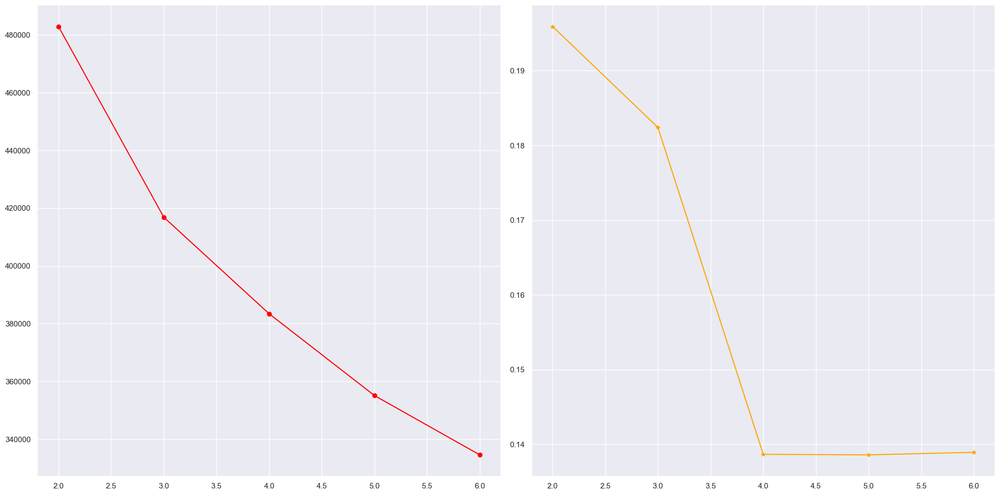

In [63]:
plt.figure(figsize=(20,10))
plt.subplot(1,2,1)
plt.plot(range(2,7),WCSS,c='red',marker='o')

plt.subplot(1,2,2)
plt.plot(range(2,7),silhouett_scores,c='orange',marker='*')

plt.tight_layout()
plt.show()

In [64]:
kmeans = KMeans(n_clusters=3,init='k-means++',random_state=42)
kmeans.fit(X_train_reduced)
y_train = kmeans.predict(X_train_reduced)
y_test = kmeans.predict(X_test_reduced)

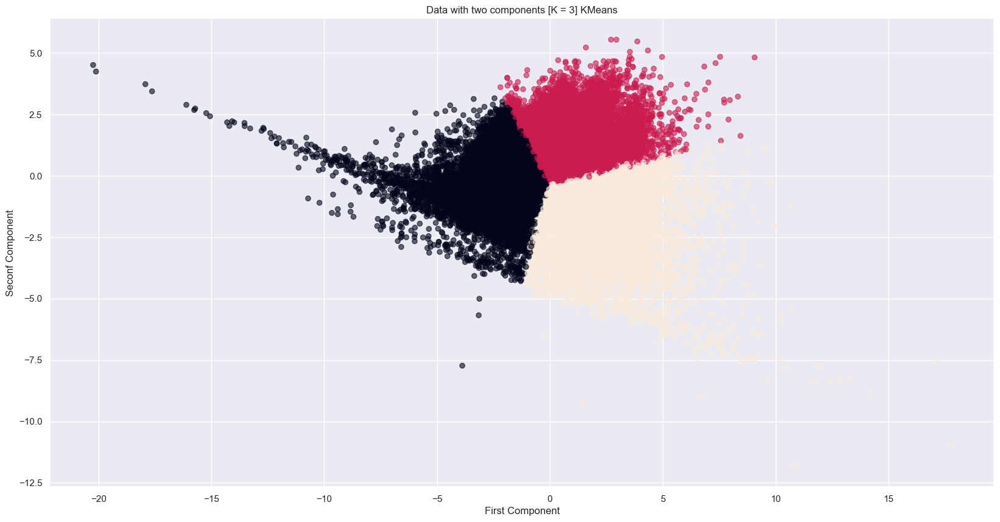

In [65]:
plt.figure(figsize=(20,10))
plt.scatter(x=df_2d[:,0],y=df_2d[:,1],alpha=.6,c=y_train)
plt.title("Data with two components [K = 3] KMeans")
plt.xlabel("First Component")
plt.ylabel("Seconf Component")
plt.show()

In [66]:
df_vis.columns

Index(['rating', 'damage_round', 'headshot_percent', 'aces', 'clutches',
       'flawless', 'first_bloods', 'win_percent', 'kd_ratio', 'kills_round',
       'most_kills', 'score_round', 'agent_1'],
      dtype='object')

In [67]:
num_cols = df_vis.select_dtypes(include='number')

In [68]:
num_cols

,damage_round,headshot_percent,aces,clutches,flawless,first_bloods,win_percent,kd_ratio,kills_round,most_kills,score_round
0,135.8,24.9,0,140,80,161.0,59.6,1.07,0.7,29,208.8
1,170.3,28.3,2,122,94,316.0,65.8,1.35,1.0,32,270.6
2,147.5,24.0,3,117,59,216.0,65.6,1.05,0.8,39,227.8
3,178.2,37.3,3,83,49,235.0,62.8,1.40,1.0,37,277.0
4,149.8,24.4,2,71,38,137.0,62.8,1.11,0.8,29,230.9
...,...,...,...,...,...,...,...,...,...,...,...
85673,138.2,21.4,0,58,54,56.0,76.2,1.19,0.7,24,210.1
85674,182.9,30.1,4,77,42,106.0,80.0,1.46,1.0,32,285.8
85675,158.8,30.2,0,70,54,185.0,52.0,1.25,0.9,33,247.9
85676,155.9,22.2,0,23,18,19.0,66.7,1.17,0.8,27,235.0


In [81]:
X_all = np.concatenate((X_train, X_test), axis=0)
y_all = np.concatenate((y_train, y_test), axis=0)
print(X_all.shape)  # should be (85678, 12)
print(y_all.shape)  # should be (85678,)

(85678, 30)
(85678,)


In [84]:
df_all = pd.DataFrame(X_all[:,1:12],columns=num_cols.columns)

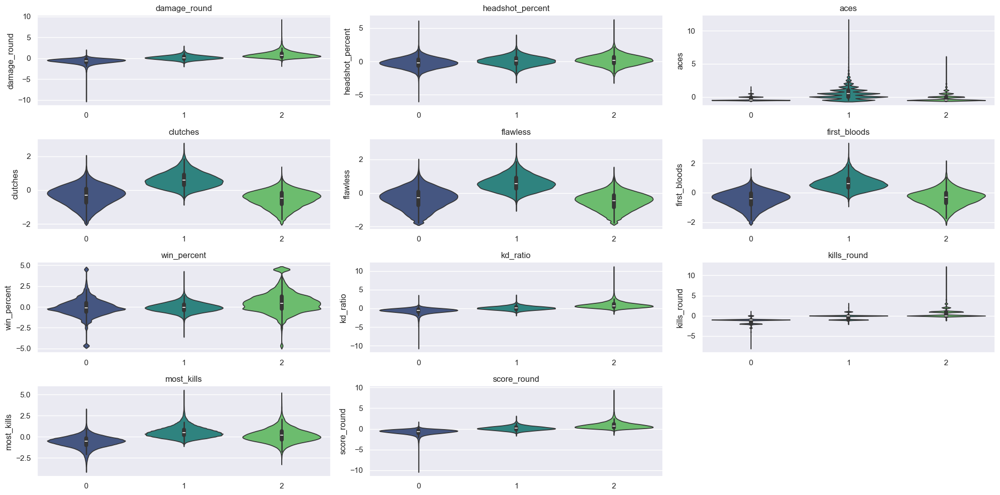

In [85]:
plt.figure(figsize=(20,10))
for i ,col in enumerate(num_cols):
    plt.subplot(4,3,i+1)
    sns.violinplot(x=y_all,y=df_all[col],palette='viridis')
    plt.title(col)


plt.tight_layout()
plt.show()

In [87]:
featuers['Clusters'] = y_all
df_vis['Clusters'] = y_all

In [88]:
vis1 = df_vis.groupby(['Clusters', 'agent_1']).size().unstack(fill_value=0)

In [89]:
vis1.head()

agent_1,Astra,Breach,Brimstone,Chamber,Cypher,Fade,Jett,KAY/O,Killjoy,Neon,Omen,Phoenix,Raze,Reyna,Sage,Skye,Sova,Viper,Yoru
Clusters,,,,,,,,,,,,,,,,,,,
0,175,222,1221,7144,172,1970,4316,697,219,415,2156,51,2252,4076,1915,667,2115,1294,214
1,159,221,1325,7439,185,2080,4604,729,255,418,2203,60,2273,4314,1956,657,2237,1367,241
2,130,154,855,4919,105,1379,3054,518,155,246,1548,24,1507,2820,1307,450,1469,897,127


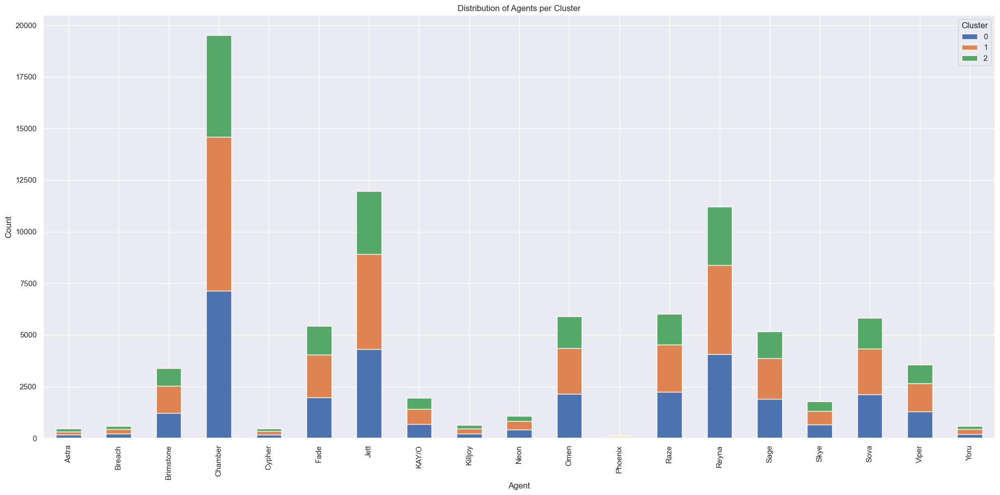

In [90]:
vis1.T.plot(kind='bar', stacked=True, figsize=(20, 10)) # .T means transpose 
plt.title("Distribution of Agents per Cluster")
plt.xlabel("Agent")
plt.ylabel("Count")
plt.legend(title="Cluster")
plt.tight_layout()
plt.show()

In [91]:
vis2 = df_vis.groupby(['Clusters','rating']).size().unstack(fill_value=0)

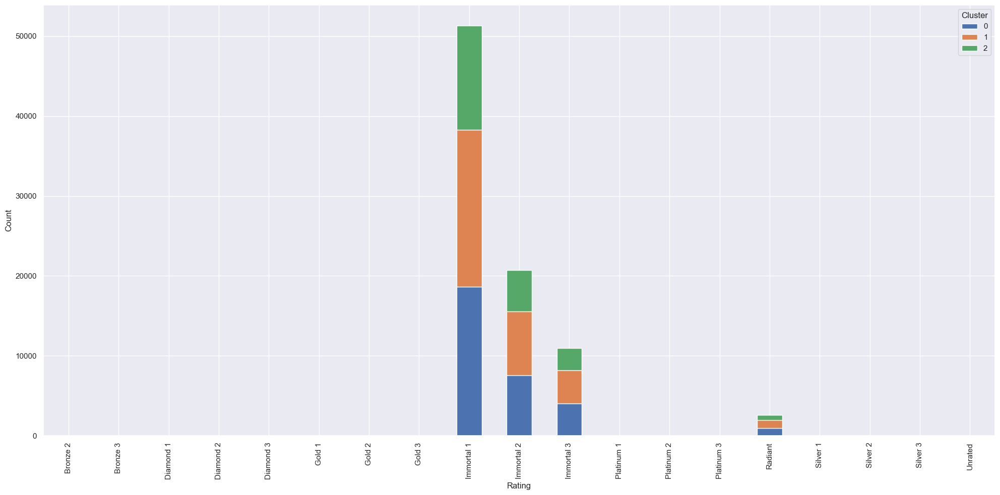

In [92]:
vis2.T.plot(kind='bar',stacked=True,figsize=(20,10))
plt.xlabel("Rating")
plt.ylabel("Count")
plt.legend(title="Cluster")
plt.tight_layout()
plt.show()

In [93]:
vis2

rating,Bronze 2,Bronze 3,Diamond 1,Diamond 2,Diamond 3,Gold 1,Gold 2,Gold 3,Immortal 1,Immortal 2,Immortal 3,Platinum 1,Platinum 2,Platinum 3,Radiant,Silver 1,Silver 2,Silver 3,Unrated
Clusters,,,,,,,,,,,,,,,,,,,
0,1,0,0,1,14,3,4,2,18665,7592,4037,5,0,1,958,2,2,0,4
1,3,1,1,0,17,1,2,2,19582,7951,4161,2,3,0,990,0,2,3,2
2,0,1,2,0,11,1,2,1,13068,5173,2738,3,0,0,659,0,0,2,3


## 🎯 Cluster Behavior Summary from Violin Plots

###  Cluster 1: **"Aggressive Carry Players"**
**Characteristics:**
- High `damage_round`, `kd_ratio`, `first_bloods`, and `most_kills`
- More variability in `flawless`, `clutches`, and `score_round`
- Slightly lower `win_percent`

**Explain:**
- Players in this cluster often engage in high-risk, high-reward plays.
- They secure many kills and take early fights (high first bloods).
- Despite strong individual performance, their team win rate isn't highest — possibly due to lack of coordination.

---

###  Cluster 2: **"Balanced Team-Oriented Players"**
**Characteristics:**
- Moderate-to-high values across most metrics (especially `win_percent`)
- Decent `kd_ratio`, `damage_round`, and `clutches`
- Less extreme outliers

**Explain:**
- These players balance kills, survival, and contribution to team success.
- Most consistent and well-rounded group.
- Likely strong communicators and team players who win more despite not topping every stat.

---

###  Cluster 0: **"Support/Passive Role Players"**
**Characteristics:**
- Lowest `damage_round`, `kd_ratio`, and `kills_round`
- Fewer `aces`, `first_bloods`, and `most_kills`
- Moderate `win_percent`

**Explain:**
- Likely to play passive or support roles — less fragging, but steady performance.
- They may play agents with utility roles (e.g., Sage, Cypher) and don’t chase fights.
- Contribute to team wins through strategy rather than aggression.


In [94]:
featuers.head()

,rating,damage_round,headshot_percent,aces,clutches,flawless,first_bloods,win_percent,kd_ratio,kills_round,...,agent_1_Omen,agent_1_Phoenix,agent_1_Raze,agent_1_Reyna,agent_1_Sage,agent_1_Skye,agent_1_Sova,agent_1_Viper,agent_1_Yoru,Clusters
0,18,135.8,24.9,0,140,80,161.0,59.6,1.07,0.7,...,False,False,False,False,False,False,False,False,False,1
1,18,170.3,28.3,2,122,94,316.0,65.8,1.35,1.0,...,False,False,False,False,False,False,False,False,False,1
2,18,147.5,24.0,3,117,59,216.0,65.6,1.05,0.8,...,False,False,False,False,False,False,False,False,True,1
3,18,178.2,37.3,3,83,49,235.0,62.8,1.40,1.0,...,False,False,False,False,False,False,False,False,False,0
4,18,149.8,24.4,2,71,38,137.0,62.8,1.11,0.8,...,False,False,False,False,False,False,False,False,False,0


In [95]:
df_vis.head()

,rating,damage_round,headshot_percent,aces,clutches,flawless,first_bloods,win_percent,kd_ratio,kills_round,most_kills,score_round,agent_1,Clusters
0,Radiant,135.8,24.9,0,140,80,161.0,59.6,1.07,0.7,29,208.8,Fade,1
1,Radiant,170.3,28.3,2,122,94,316.0,65.8,1.35,1.0,32,270.6,Chamber,1
2,Radiant,147.5,24.0,3,117,59,216.0,65.6,1.05,0.8,39,227.8,Yoru,1
3,Radiant,178.2,37.3,3,83,49,235.0,62.8,1.40,1.0,37,277.0,Jett,0
4,Radiant,149.8,24.4,2,71,38,137.0,62.8,1.11,0.8,29,230.9,Jett,0


In [96]:
df_vis.to_csv('Valo_dataToVis.csv',index=False)

In [97]:
featuers.shape

(85678, 31)

In [98]:
from sklearn.model_selection import RandomizedSearchCV
from sklearn.ensemble import RandomForestClassifier

In [86]:
# params ={
#     'n_estimators':[50,100,200],
#     'max_depth': [None,10,20],
#     'min_samples_split':[2,5,10],
#     'min_samples_leaf' : [1,5,10]
# }

# random_search = RandomizedSearchCV(
#     estimator=RandomForestClassifier(),param_distributions=params,n_iter=10,cv=5,
#     random_state=42,
# )

# random_search.fit(X_train, y_train)

# print("Best parameters found:", random_search.best_params_)

## Result: 
**Best parameters found: {'n_estimators': 100, 'min_samples_split': 5,'min_samples_leaf': 1, 'max_depth': None}**

In [99]:
model = RandomForestClassifier(n_estimators=50,min_samples_leaf=5,
                               min_samples_split=10,
                               max_depth=10)
model.fit(X_train,y_train)
y_pred = model.predict(X_test)

In [100]:
from sklearn.metrics import classification_report,confusion_matrix

In [101]:
report = classification_report(y_test,y_pred)
print(report)

              precision    recall  f1-score   support

           0       0.96      0.96      0.96      6228
           1       0.94      0.94      0.94      6497
           2       0.93      0.94      0.94      4411

    accuracy                           0.95     17136
   macro avg       0.94      0.95      0.95     17136
weighted avg       0.95      0.95      0.95     17136



In [102]:
y_train_pred = model.predict(X_train)
print("Train Report:\n", model.score(X_train, y_train))

y_test_pred = model.predict(X_test)
print("Test Report:\n", model.score(X_test, y_test))

Train Report:
 0.9610311925534709
Test Report:
 0.9463118580765639


In [126]:
from sklearn.metrics import confusion_matrix

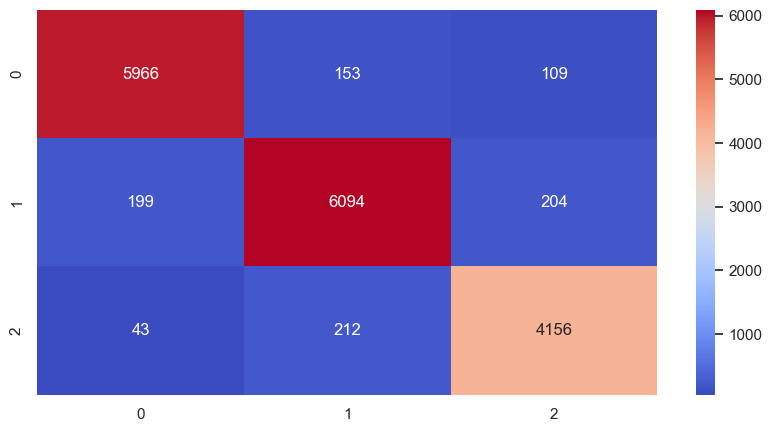

In [129]:
cm = confusion_matrix(y_test,y_pred)
plt.figure(figsize=(10,5))
sns.heatmap(data=cm,annot=True,fmt='d',cmap='coolwarm')
plt.show()

## Model Performance Analysis
The training accuracy is `96.01%` and the test accuracy is `94.72%`, with a small gap of about `1.29%`. This means the model is performing well on both training and test data, and **is not overfitting.** A small gap like this is a good sign that the model generalizes well to new data.

In [103]:
import joblib
joblib.dump(model, "Final_model2.pkl")
joblib.dump(pt,"Transformer2.pkl")
joblib.dump(robust,"RobustScaler2.pkl")

['RobustScaler2.pkl']

In [92]:
df.head()

,region,name,tag,rating,damage_round,headshots,headshot_percent,aces,clutches,flawless,...,gun2_name,gun2_head,gun2_body,gun2_legs,gun2_kills,gun3_name,gun3_head,gun3_body,gun3_legs,gun3_kills
0,NaN,ShimmyXD,#NA1,Radiant,135.8,992,24.9,0,140,80,...,Phantom,33,62,5,220,Classic,36,60,3,147
1,NaN,XSET Cryo,#cells,Radiant,170.3,879,28.3,2,122,94,...,Operator,8,91,0,226,Phantom,32,63,5,137
2,NaN,PuRelittleone,#yoruW,Radiant,147.5,720,24.0,3,117,59,...,Phantom,36,61,3,231,Operator,8,91,1,102
3,NaN,Boba,#0068,Radiant,178.2,856,37.3,3,83,49,...,Sheriff,48,51,1,48,Phantom,44,56,0,36
4,NaN,i love mina,#kelly,Radiant,149.8,534,24.4,2,71,38,...,Spectre,21,71,8,65,Operator,8,92,0,64


In [104]:
df.columns

Index(['region', 'name', 'tag', 'rating', 'damage_round', 'headshots',
       'headshot_percent', 'aces', 'clutches', 'flawless', 'first_bloods',
       'kills', 'deaths', 'assists', 'kd_ratio', 'kills_round', 'most_kills',
       'score_round', 'wins', 'win_percent', 'agent_1', 'agent_2', 'agent_3',
       'gun1_name', 'gun1_head', 'gun1_body', 'gun1_legs', 'gun1_kills',
       'gun2_name', 'gun2_head', 'gun2_body', 'gun2_legs', 'gun2_kills',
       'gun3_name', 'gun3_head', 'gun3_body', 'gun3_legs', 'gun3_kills'],
      dtype='object')

In [105]:
df.shape

(85678, 38)

In [133]:
df['Clusters'] = y_all

In [134]:
df['Clusters'].replace({1:'Aggressive Carry Player',2:'Balanced Team-Oriented Player',0:'Support Role Player'},inplace=True)

In [135]:
df_story = df[['region', 'name','rating', 'damage_round', 'headshots',
       'headshot_percent', 'aces', 'clutches', 'flawless', 'first_bloods',
       'kills', 'deaths', 'assists', 'kd_ratio', 'kills_round', 'most_kills',
       'score_round', 'wins', 'win_percent', 'agent_1','gun1_name','Clusters']]

In [136]:
df_story

,region,name,rating,damage_round,headshots,headshot_percent,aces,clutches,flawless,first_bloods,...,assists,kd_ratio,kills_round,most_kills,score_round,wins,win_percent,agent_1,gun1_name,Clusters
0,NaN,ShimmyXD,Radiant,135.8,992,24.9,0,140,80,161,...,703.0,1.07,0.7,29,208.8,59,59.6,Fade,Vandal,Aggressive Carry Player
1,NaN,XSET Cryo,Radiant,170.3,879,28.3,2,122,94,316,...,206.0,1.35,1.0,32,270.6,52,65.8,Chamber,Vandal,Aggressive Carry Player
2,NaN,PuRelittleone,Radiant,147.5,720,24.0,3,117,59,216,...,267.0,1.05,0.8,39,227.8,42,65.6,Yoru,Vandal,Aggressive Carry Player
3,NaN,Boba,Radiant,178.2,856,37.3,3,83,49,235,...,157.0,1.40,1.0,37,277.0,32,62.8,Jett,Vandal,Support Role Player
4,NaN,i love mina,Radiant,149.8,534,24.4,2,71,38,137,...,213.0,1.11,0.8,29,230.9,32,62.8,Jett,Vandal,Support Role Player
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
85673,LAT,Kazutora,Radiant,138.2,342,21.4,0,58,54,56,...,296.0,1.19,0.7,24,210.1,32,76.2,Sova,Phantom,Support Role Player
85674,LAT,el lobo marino,Radiant,182.9,650,30.1,4,77,42,106,...,271.0,1.46,1.0,32,285.8,32,80.0,Viper,Phantom,Support Role Player
85675,LAT,p9pzet,Radiant,158.8,613,30.2,0,70,54,185,...,136.0,1.25,0.9,33,247.9,26,52.0,Chamber,Vandal,Aggressive Carry Player
85676,LAT,EZ4TGD EnSBuwu,Immortal 3,155.9,132,22.2,0,23,18,19,...,101.0,1.17,0.8,27,235.0,8,66.7,Brimstone,Vandal,Support Role Player


In [146]:
df_story.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 85678 entries, 0 to 85677
Data columns (total 22 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   region            64813 non-null  object 
 1   name              85674 non-null  object 
 2   rating            85678 non-null  object 
 3   damage_round      85678 non-null  float64
 4   headshots         85678 non-null  float64
 5   headshot_percent  85678 non-null  float64
 6   aces              85678 non-null  int64  
 7   clutches          85678 non-null  int64  
 8   flawless          85678 non-null  int64  
 9   first_bloods      85678 non-null  float64
 10  kills             85678 non-null  float64
 11  deaths            85678 non-null  float64
 12  assists           85678 non-null  float64
 13  kd_ratio          85678 non-null  float64
 14  kills_round       85678 non-null  float64
 15  most_kills        85678 non-null  int64  
 16  score_round       85678 non-null  float6

In [137]:
df_story.isna().sum()

region              20865
name                    4
rating                  0
damage_round            0
headshots               0
headshot_percent        0
aces                    0
clutches                0
flawless                0
first_bloods            0
kills                   0
deaths                  0
assists                 0
kd_ratio                0
kills_round             0
most_kills              0
score_round             0
wins                    0
win_percent             0
agent_1                 0
gun1_name               0
Clusters                0
dtype: int64

In [144]:
df_story.to_csv('Valorant_StoryTelling.csv',index=False)

In [2]:
df_story = pd.read_csv('Valorant_StoryTelling.csv')

In [3]:
df_story.columns

Index(['region', 'name', 'rating', 'damage_round', 'headshots',
       'headshot_percent', 'aces', 'clutches', 'flawless', 'first_bloods',
       'kills', 'deaths', 'assists', 'kd_ratio', 'kills_round', 'most_kills',
       'score_round', 'wins', 'win_percent', 'agent_1', 'gun1_name',
       'Clusters'],
      dtype='object')

In [4]:
df_story['first_bloods'] = df_story['first_bloods'].astype(str).str.replace(',', '', regex=False)
df_story['first_bloods'] = df_story['first_bloods'].astype(float)
df_story['headshots'] = df_story['headshots'].astype(str).str.replace(',', '', regex=False)
df_story['headshots'] = df_story['headshots'].astype(float)

In [5]:
df_story['region'].replace({'AP':'Asia Pacific','BR':'Brazil','EU':'Europe','KR':'Korea','LAT':'Latin America'},inplace=True)

In [6]:
vis1 = df_story.groupby(['region','Clusters'])['name'].count().unstack()

In [7]:
vis1

Clusters,Aggressive Carry Player,Balanced Team-Oriented Player,Support Role Player
region,,,
Asia Pacific,7290,4893,7159
Brazil,2698,1788,2509
Europe,12545,8260,11893
Korea,932,642,913
Latin America,1238,825,1224


## 1 ) Player Cluster Distribution by Region

This chart compares how different regions (AP, BR, EU, KR, LAT) are distributed across the three identified player clusters:

### What to Notice:
- **Europe** has the largest overall players.
- **Korea** has the smallest sample size.
- **Balanced Team-Oriented Player** is the least cluster all over regions.

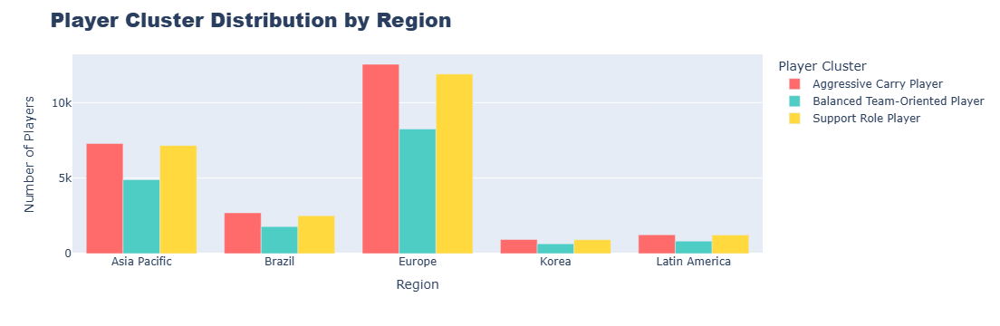

In [8]:
fig = px.bar(
    data_frame=vis1,
    barmode='group',
    color_discrete_sequence=['#FF6B6B','#4ECDC4','#FFD93D']   
)
fig.update_layout(
    title='Player Cluster Distribution by Region',
    title_font=dict(size=22, family='Arial Black'),
    xaxis_title='Region',
    yaxis_title='Number of Players',
    legend_title='Player Cluster',
)

fig.show()


## 2 ) Kill/Death Ratio Distribution Across Regions

This Violins plot visualizes the distribution of **Kill/Death (K/D) ratios** for players across different regions, segmented by cluster.

### Key Insight:
Despite some minor variations, **there is no significant difference in K/D ratio between regions**. Most regions share a similar range and median K/D values .

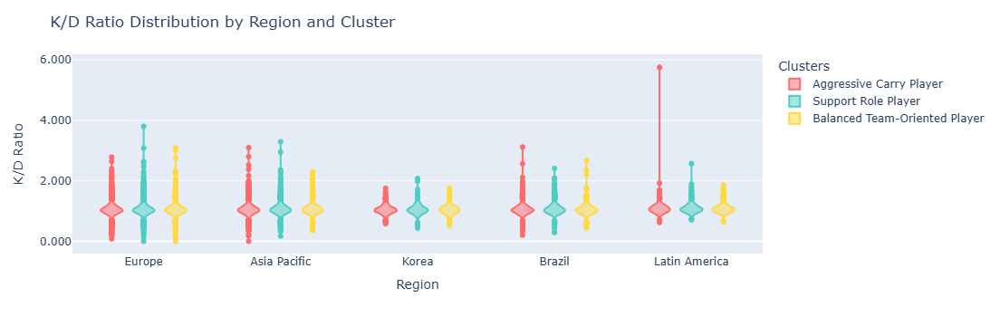

In [206]:

fig = px.violin(data_frame=df_story,x='region',y='kd_ratio',color='Clusters',color_discrete_sequence=['#FF6B6B','#4ECDC4','#FFD93D'])

fig.update_layout(
    yaxis=dict(
        nticks=6,               
        tickformat='.3f', 
        title='K/D Ratio',
    ),
    xaxis_title='Region',
    boxmode='group',
    title='K/D Ratio Distribution by Region and Cluster'
)

fig.show()

In [9]:
vis2 = df_story.groupby(['region','gun1_name']).size().unstack(fill_value=0)
vis2.head()

gun1_name,Ares,Classic,Frenzy,Ghost,Guardian,Judge,Marshal,Odin,Operator,Phantom,Sheriff,Spectre,Vandal,Bucky,Bulldog
region,,,,,,,,,,,,,,,
Asia Pacific,1,1,1,6,6,20,1,18,65,2239,5,12,16969,0,0
Brazil,1,3,0,1,0,3,0,8,22,648,2,4,6303,0,0
Europe,0,3,6,7,7,28,1,9,192,3407,6,17,29015,1,1
Korea,0,0,0,1,0,10,0,6,15,422,3,1,2028,1,0
Latin America,0,0,0,0,0,1,0,1,9,456,0,0,2819,0,1


## 3 ) Weapon Preference

After analyzing weapon selections across all regions, it's clear that the **Vandal** is by far the most picked gun in the dataset — significantly ahead of any other weapon.

### Top Picks:
- **🥇 Vandal** — Dominates the loadout choices across all regions and roles
- **🥈 Phantom** — A solid second choice, but still far behind the Vandal


### Insight:
The popularity of the Vandal likely stems from its **one-tap headshot potential** at all ranges, making it a favorite among aggressive and precision-focused players.  
The Phantom, while slightly more forgiving in recoil, sees more use in **close-range or team-oriented strategies**.

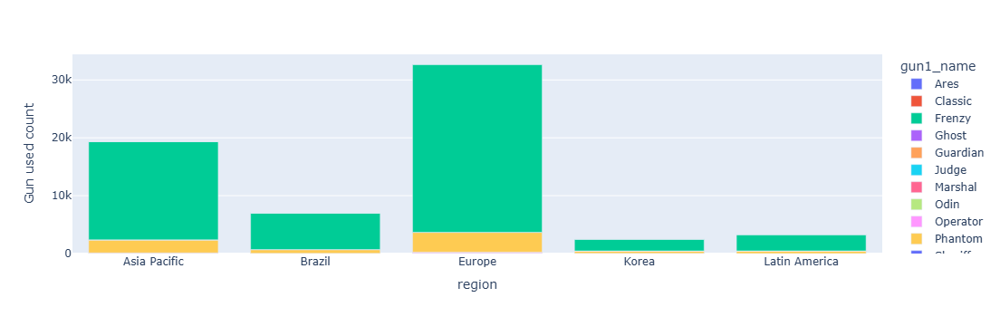

In [28]:
fig = px.bar(data_frame=vis2,x=vis2.index,y=vis2.columns)
fig.update_layout(
    yaxis = dict(title = 'Gun used count')
)
fig.show()

In [43]:
vis3 = df_story.groupby(['region', 'agent_1']).size().reset_index(name='count')
vis3

,region,agent_1,count
0,Asia Pacific,Astra,189
1,Asia Pacific,Breach,112
2,Asia Pacific,Brimstone,577
3,Asia Pacific,Chamber,4397
4,Asia Pacific,Cypher,93
...,...,...,...
90,Latin America,Sage,144
91,Latin America,Skye,61
92,Latin America,Sova,227
93,Latin America,Viper,147


## 4 ) Top 3 Most Picked Agents per Region

Analyzing agent selection across regions reveals clear preferences.

### Agent Preferences by Region:

#### **Asia Pacific (AP):**
1. **Chamber**
2. **Jett**
3. **Reyna**

#### **Europe (EU):**
1. **Chamber**
2. **Jett**
3. **Reyna**

#### **Brazil (BR):**
1. **Chamber**
2. **Reyna**
3. **Raze**

#### **Korea (KR):**
1. **Chamber**
2. **Jett**
3. **Reyna**

#### **Latin America (LAT):**
1. **Chamber**
2. **Reyna**
3. **Jett**

---

### Insight:
- **Chamber** appears in the `First Place` for **every region**, highlighting his global dominance.
- **Jett** and **Reyna** are also widely favored.

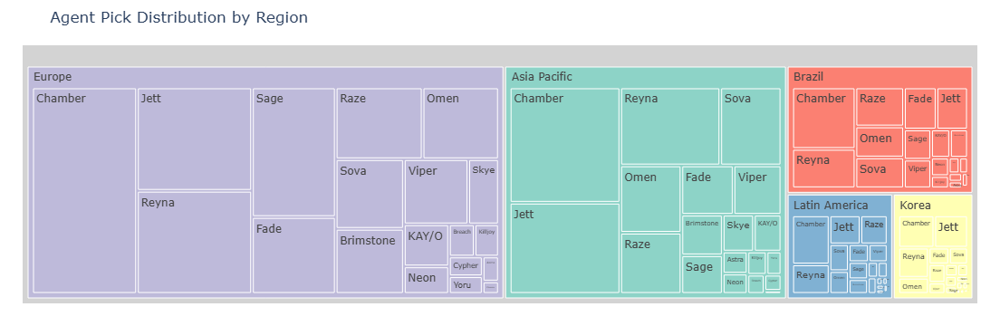

In [48]:
fig = px.treemap(
    vis3,
    path=['region', 'agent_1'],  
    values='count',
    color='region', 
    title='Agent Pick Distribution by Region',
    color_discrete_sequence=px.colors.qualitative.Set3
)
fig.update_traces(root_color="lightgrey")
fig.update_layout(margin=dict(t=50, l=25, r=25, b=25))
fig.show()